In [ ]:
import polars as pl
import pandas as pd
import matplotlib

In [ ]:
summary = pl.read_csv("/work/Loneliness/atussum_2022.dat")
resp = pl.read_csv("/work/Loneliness/atusresp_2022.dat")
cps = pl.read_csv("/work/Loneliness/atuscps_2022.dat", infer_schema_length=1000000)

In [ ]:
gestfips_state_data = {
    1: "AL", 17: "IL", 30: "MT", 44: "RI",
    2: "AK", 18: "IN", 31: "NE", 45: "SC",
    4: "AZ", 19: "IA", 32: "NV", 46: "SD",
    5: "AR", 20: "KS", 33: "NH", 47: "TN",
    6: "CA", 21: "KY", 34: "NJ", 48: "TX",
    8: "CO", 22: "LA", 35: "NM", 49: "UT",
    9: "CT", 23: "ME", 36: "NY", 50: "VT",
    10: "DE", 24: "MD", 37: "NC", 51: "VA",
    11: "DC", 25: "MA", 38: "ND", 53: "WA",
    12: "FL", 26: "MI", 39: "OH", 54: "WV",
    13: "GA", 27: "MN", 40: "OK", 55: "WI",
    15: "HI", 28: "MS", 41: "OR", 56: "WY",
    16: "ID", 29: "MO", 42: "PA"
}

In [ ]:
resp.columns

['TUCASEID',
 'TULINENO',
 'TUYEAR',
 'TUMONTH',
 'TEABSRSN',
 'TEERN',
 'TEERNH1O',
 'TEERNH2',
 'TEERNHRO',
 'TEERNHRY',
 'TEERNPER',
 'TEERNRT',
 'TEERNUOT',
 'TEERNWKP',
 'TEHRFTPT',
 'TEHRUSL1',
 'TEHRUSL2',
 'TEHRUSLT',
 'TEIO1COW',
 'TEIO1ICD',
 'TEIO1OCD',
 'TELAYAVL',
 'TELAYLK',
 'TELFS',
 'TELKAVL',
 'TELKM1',
 'TEMJOT',
 'TERET1',
 'TESCHENR',
 'TESCHFT',
 'TESCHLVL',
 'TESPEMPNOT',
 'TESPUHRS',
 'TRCHILDNUM',
 'TRDPFTPT',
 'TRDTIND1',
 'TRDTOCC1',
 'TRERNHLY',
 'TRERNUPD',
 'TRERNWA',
 'TRHERNAL',
 'TRHHCHILD',
 'TRHOLIDAY',
 'TRIMIND1',
 'TRMJIND1',
 'TRMJOCC1',
 'TRMJOCGR',
 'TRNHHCHILD',
 'TRNUMHOU',
 'TROHHCHILD',
 'TRSPFTPT',
 'TRSPPRES',
 'TRTALONE',
 'TRTALONE_WK',
 'TRTCC',
 'TRTCCC',
 'TRTCCC_WK',
 'TRTCCTOT',
 'TRTCHILD',
 'TRTCOC',
 'TRTEC',
 'TRTFAMILY',
 'TRTFRIEND',
 'TRTHH',
 'TRTHHFAMILY',
 'TRTNOCHILD',
 'TRTNOHH',
 'TRTO',
 'TRTOHH',
 'TRTOHHCHILD',
 'TRTONHH',
 'TRTONHHCHILD',
 'TRTSPONLY',
 'TRTSPOUSE',
 'TRTUNMPART',
 'TRWERNAL',
 'TRYHHCHILD',
 'TTHR'

In [ ]:
alone_base = resp.select(pl.col('TUCASEID', 'TRTALONE', 'TULINENO', 'TUFINLWGT'))
alone_base.head()

TUCASEID,TRTALONE,TULINENO,TUFINLWGT
i64,i64,i64,f64
20220101220017,110,1,3.1372e7
20220101220500,770,1,4.1333e7
20220101220504,350,1,5.7090e6
20220101220507,305,1,5.0246e6
20220101220552,182,1,1.2480e7


In [ ]:
alone_base_pd = alone_base.to_pandas()

In [ ]:
alone_base_pd

,TUCASEID,TRTALONE,TULINENO,TUFINLWGT
0,20220101220017,110,1,3.137241e+07
1,20220101220500,770,1,4.133324e+07
2,20220101220504,350,1,5.708959e+06
3,20220101220507,305,1,5.024633e+06
4,20220101220552,182,1,1.247984e+07
...,...,...,...,...
8131,20221212222086,70,1,2.418088e+07
8132,20221212222264,65,1,1.447649e+07
8133,20221212222322,330,1,9.266696e+06
8134,20221212222359,0,1,9.239151e+06


In [ ]:
(lambda: DeepnoteChart(alone_base_pd, """{"layer":[{"layer":[{"mark":{"clip":true,"type":"bar","color":"#2266D3","tooltip":true},"encoding":{"x":{"sort":null,"type":"quantitative","field":"TRTALONE","scale":{"type":"linear"},"stack":"zero","format":{"type":"default","decimals":null},"formatType":"numberFormatFromNumberType"},"y":{"sort":null,"type":"quantitative","scale":{"type":"linear"},"stack":"zero","format":{"type":"default","decimals":null},"aggregate":"count","formatType":"numberFormatFromNumberType"}}}]}],"title":"","config":{"legend":{}},"$schema":"https://vega.github.io/schema/vega-lite/v5.json","encoding":{}}""") if 'DeepnoteChart' in globals() else _dntk.DeepnoteChart(alone_base_pd, """{"layer":[{"layer":[{"mark":{"clip":true,"type":"bar","color":"#2266D3","tooltip":true},"encoding":{"x":{"sort":null,"type":"quantitative","field":"TRTALONE","scale":{"type":"linear"},"stack":"zero","format":{"type":"default","decimals":null},"formatType":"numberFormatFromNumberType"},"y":{"sort":null,"type":"quantitative","scale":{"type":"linear"},"stack":"zero","format":{"type":"default","decimals":null},"aggregate":"count","formatType":"numberFormatFromNumberType"}}}]}],"title":"","config":{"legend":{}},"$schema":"https://vega.github.io/schema/vega-lite/v5.json","encoding":{}}"""))()

In [ ]:
(alone_base.describe().select(pl.col('TRTALONE'))/60)*7

TRTALONE
f64
949.2
0.0
40.263895
33.037762
0.0
12.25
32.666667
63.583333
168.0


In [ ]:
resp

TUCASEID,TULINENO,TUYEAR,TUMONTH,TEABSRSN,TEERN,TEERNH1O,TEERNH2,TEERNHRO,TEERNHRY,TEERNPER,TEERNRT,TEERNUOT,TEERNWKP,TEHRFTPT,TEHRUSL1,TEHRUSL2,TEHRUSLT,TEIO1COW,TEIO1ICD,TEIO1OCD,TELAYAVL,TELAYLK,TELFS,TELKAVL,TELKM1,TEMJOT,TERET1,TESCHENR,TESCHFT,TESCHLVL,TESPEMPNOT,TESPUHRS,TRCHILDNUM,TRDPFTPT,TRDTIND1,TRDTOCC1,…,TXERN,TXERNH1O,TXERNH2,TXERNHRO,TXERNHRY,TXERNPER,TXERNRT,TXERNUOT,TXERNWKP,TXHRFTPT,TXHRUSL1,TXHRUSL2,TXHRUSLT,TXIO1COW,TXIO1ICD,TXIO1OCD,TXLAYAVL,TXLAYLK,TXLFS,TXLKAVL,TXLKM1,TXMJOT,TXRET1,TXSCHENR,TXSCHFT,TXSCHLVL,TXSPEMPNOT,TXSPUHRS,TXTCC,TXTCCTOT,TXTCOC,TXTHH,TXTNOHH,TXTO,TXTOHH,TXTONHH,TREMODR
i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,…,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64
20220101220017,1,2022,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,40,-1,40,7,4972,4700,-1,-1,1,-1,-1,2,-1,-1,-1,-1,1,40,2,1,22,16,…,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,0,1,0,0,0,0,-1,-1,0,-1,-1,0,-1,-1,-1,-1,0,0,1,1,0,1,-1,1,1,-1,1
20220101220500,1,2022,1,-1,-1,1600,-1,40,1,1,-1,2,-1,-1,40,-1,40,4,170,6050,-1,-1,1,-1,-1,2,-1,2,-1,-1,1,55,0,1,1,18,…,1,0,1,0,0,0,1,0,1,1,0,1,0,0,0,0,-1,-1,0,-1,-1,0,-1,0,1,1,0,0,-1,0,0,-1,-1,-1,-1,-1,1
20220101220504,1,2022,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,24,-1,24,7,8980,4510,-1,-1,1,-1,-1,2,-1,-1,-1,-1,1,60,0,2,48,15,…,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,0,1,0,0,0,0,-1,-1,0,-1,-1,0,-1,-1,-1,-1,0,0,-1,0,0,-1,-1,-1,-1,-1,1
20220101220507,1,2022,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,25,-1,25,7,7890,2360,-1,-1,1,-1,-1,2,-1,-1,-1,-1,1,30,0,2,40,8,…,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,0,1,0,40,0,0,-1,-1,0,-1,-1,11,-1,-1,-1,-1,0,0,-1,0,0,-1,-1,-1,-1,-1,1
20220101220552,1,2022,1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,5,-1,-1,-1,2,-1,-1,-1,2,-1,0,-1,-1,-1,…,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,0,-1,-1,-1,0,-1,-1,-1,0,-1,-1,0,0,-1,-1,-1,-1,-1,1
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
20221212222086,1,2022,12,-1,-1,-1,-1,-1,2,4,2,2,-1,-1,40,12,52,4,6680,1021,-1,-1,1,-1,-1,1,-1,2,-1,-1,1,40,1,1,29,3,…,1,1,1,1,0,0,13,0,1,1,0,0,0,0,0,0,-1,-1,0,-1,-1,0,-1,0,1,1,0,0,-1,0,0,-1,-1,-1,-1,-1,1
20221212222264,1,2022,12,-1,-1,-1,-1,-1,2,6,2,2,52,-1,40,-1,40,4,2190,2640,-1,-1,1,-1,-1,2,-1,2,-1,-1,1,40,0,1,19,9,…,1,1,1,1,0,0,0,0,0,1,0,1,0,0,0,0,-1,-1,0,-1,-1,0,-1,0,1,1,0,0,-1,0,0,-1,-1,-1,-1,-1,1
20221212222322,1,2022,12,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,5,-1,-1,-1,-1,-1,-1,-1,-1,-1,0,-1,-1,-1,…,-1,-1,-1,-1,-1,-1,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,-1,0,-1,-1,-1,1,-1,-1,-1,-1,-1,-1,0,0,-1,-1,-1,-1,-1,1


In [ ]:
cps.unique(subset=['TUCASEID'])
cps_unique = cps.unique(subset=['TUCASEID'])

In [ ]:
cps_age = cps.select(pl.col('TUCASEID', 'PRTAGE', 'TULINENO'))

In [ ]:
cps_age

TUCASEID,PRTAGE,TULINENO
i64,i64,i64
20220101220017,52,1
20220101220017,49,2
20220101220017,22,3
20220101220017,17,4
20220101220017,12,5
…,…,…
20221212222359,80,2
20221212222386,85,1
20221212222386,80,2


In [ ]:
cps_base = cps_unique.select(pl.col('TUCASEID', 'GESTFIPS','GTCO', 'PRTAGE'))
cps_base.select(pl.col("GTCO")).group_by("GTCO").count()

/tmp/ipykernel_146/572551353.py:2: DeprecationWarning: `count` is deprecated. It has been renamed to `len`.
  cps_base.select(pl.col("GTCO")).group_by("GTCO").count()


GTCO,count
i64,u32
0,13626
173,41
423,25
33,199
27,152
…,…
119,155
53,50
77,55


In [ ]:
cps_base_plus = cps_base.with_columns(pl.concat_str([pl.col("GESTFIPS"), pl.col("GTCO")], separator='-').alias("location"))

In [ ]:
cps_base_plus

TUCASEID,GESTFIPS,GTCO,PRTAGE,location
i64,i64,i64,i64,str
20220606221873,42,0,60,"""42-0"""
20221008220039,5,0,85,"""5-0"""
20221009222155,6,75,48,"""6-75"""
20221110222064,55,0,51,"""55-0"""
20220908220548,24,0,68,"""24-0"""
…,…,…,…,…
20221210221822,6,0,52,"""6-0"""
20220101221706,47,0,78,"""47-0"""
20220907220837,45,0,18,"""45-0"""


In [ ]:
alone_base

TUCASEID,TRTALONE,TULINENO,TUFINLWGT
i64,i64,i64,f64
20220101220017,110,1,3.1372e7
20220101220500,770,1,4.1333e7
20220101220504,350,1,5.7090e6
20220101220507,305,1,5.0246e6
20220101220552,182,1,1.2480e7
…,…,…,…
20221212222086,70,1,2.4181e7
20221212222264,65,1,1.4476e7
20221212222322,330,1,9.2667e6


In [ ]:
alone_base.select(pl.col('TUCASEID')).unique().count()

TUCASEID
u32
8136


In [ ]:
alone_location = alone_base.join(cps_base_plus, on = "TUCASEID", how = 'left')
alone_location.shape

(8136, 8)

In [ ]:
alone_location.filter(pl.col("TUCASEID") == 20211212212479)

TUCASEID,TRTALONE,TULINENO,TUFINLWGT,GESTFIPS,GTCO,PRTAGE,location
i64,i64,i64,f64,i64,i64,i64,str


In [ ]:
alone_base.filter(pl.col("TUCASEID") == 20220101220504)

TUCASEID,TRTALONE,TULINENO,TUFINLWGT
i64,i64,i64,f64
20220101220504,350,1,5.7090e6


In [ ]:
cps_base.filter(pl.col("TUCASEID") == 20220101220504)

TUCASEID,GESTFIPS,GTCO,PRTAGE
i64,i64,i64,i64
20220101220504,26,0,64


In [ ]:
alone_location.head()

TUCASEID,TRTALONE,TULINENO,TUFINLWGT,GESTFIPS,GTCO,PRTAGE,location
i64,i64,i64,f64,i64,i64,i64,str
20220101220017,110,1,3.1372e7,34,5,52,"""34-5"""
20220101220500,770,1,4.1333e7,25,17,30,"""25-17"""
20220101220504,350,1,5.7090e6,26,0,64,"""26-0"""
20220101220507,305,1,5.0246e6,6,59,60,"""6-59"""
20220101220552,182,1,1.2480e7,55,0,73,"""55-0"""


In [ ]:
!pip install joypy==0.2.6


[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


In [ ]:
cropped = alone_location.filter(pl.col("location").is_in(["34-5", "25-17", "26-0"]))

In [ ]:
cropped
cropped_filtered = cropped[['TRTALONE', 'location']]
cropped_filtered_pd = cropped_filtered.to_pandas()

In [ ]:
alone_location_filtered = alone_location[['TRTALONE', 'location', 'GESTFIPS']]
alone_location_filtered_pd = alone_location_filtered.to_pandas()

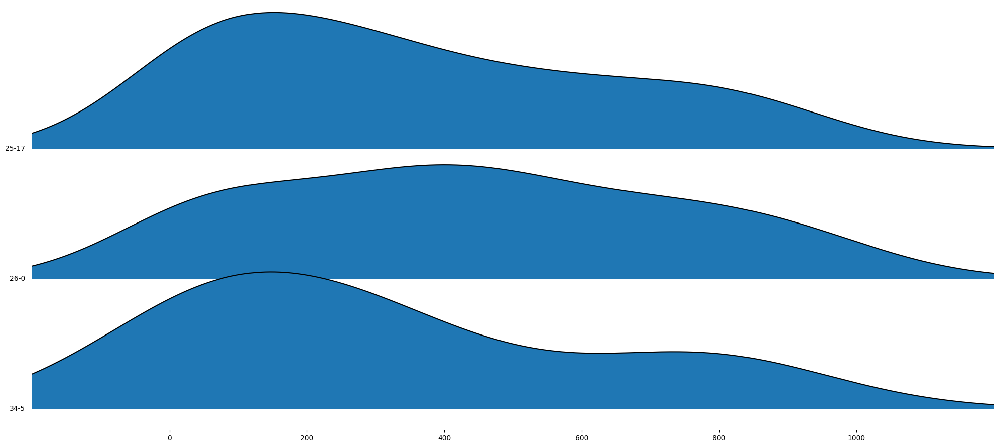

In [ ]:
import joypy

fig, axes = joypy.joyplot(cropped_filtered_pd, by='location', figsize=(20,9))
fig.savefig('test2png2.png', dpi=200)


/root/venv/lib/python3.9/site-packages/joypy/joyplot.py:286: UserWarning: The data contains a group with a single distinct value (1) having infinite probability density. Consider using a different visualization.
  warnings.warn("The data contains a group with a single distinct value ({}) "
/root/venv/lib/python3.9/site-packages/joypy/joyplot.py:286: UserWarning: The data contains a group with a single distinct value (10) having infinite probability density. Consider using a different visualization.
  warnings.warn("The data contains a group with a single distinct value ({}) "
/root/venv/lib/python3.9/site-packages/joypy/joyplot.py:286: UserWarning: The data contains a group with a single distinct value (12) having infinite probability density. Consider using a different visualization.
  warnings.warn("The data contains a group with a single distinct value ({}) "
/root/venv/lib/python3.9/site-packages/joypy/joyplot.py:286: UserWarning: The data contains a group with a single distinct va

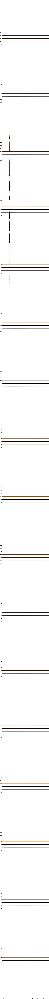

In [ ]:
fig, axes = joypy.joyplot(alone_location_filtered_pd, by='location', figsize=(15,300))
fig.savefig('test2png2.png', dpi=200)

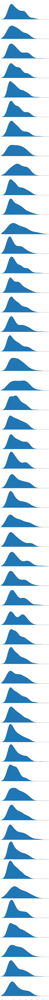

In [ ]:
#joyplot state

fig, axes = joypy.joyplot(alone_location_filtered_pd, by='GESTFIPS', figsize=(15,300))
fig.savefig('test2png2.png', dpi=200)

In [ ]:
alone_location.group_by('location').count().sort('count')

/tmp/ipykernel_146/592043765.py:1: DeprecationWarning: `count` is deprecated. It has been renamed to `len`.
  alone_location.group_by('location').count().sort('count')


location,count
str,u32
"""34-19""",1
"""35-45""",1
"""13-15""",1
"""24-17""",1
"""13-151""",2
…,…
"""6-37""",175
"""6-0""",176
"""39-0""",212


In [ ]:
alone_location.select(pl.col=='TRTALONE')

literal
bool
false


In [ ]:
alone_location.group_by('GESTFIPS').count()

/tmp/ipykernel_146/293291811.py:1: DeprecationWarning: `count` is deprecated. It has been renamed to `len`.
  alone_location.group_by('GESTFIPS').count()


GESTFIPS,count
i64,u32
12,426
42,316
6,754
18,198
9,99
…,…
53,219
56,21
47,195


In [ ]:
alone_location

TUCASEID,TRTALONE,TULINENO,TUFINLWGT,GESTFIPS,GTCO,PRTAGE,location
i64,i64,i64,f64,i64,i64,i64,str
20220101220017,110,1,3.1372e7,34,5,52,"""34-5"""
20220101220500,770,1,4.1333e7,25,17,30,"""25-17"""
20220101220504,350,1,5.7090e6,26,0,64,"""26-0"""
20220101220507,305,1,5.0246e6,6,59,60,"""6-59"""
20220101220552,182,1,1.2480e7,55,0,73,"""55-0"""
…,…,…,…,…,…,…,…
20221212222086,70,1,2.4181e7,36,59,44,"""36-59"""
20221212222264,65,1,1.4476e7,26,99,43,"""26-99"""
20221212222322,330,1,9.2667e6,30,0,64,"""30-0"""


In [ ]:
alone_location.filter(pl.col("GESTFIPS") == 34)

TUCASEID,TRTALONE,TULINENO,TUFINLWGT,GESTFIPS,GTCO,PRTAGE,location
i64,i64,i64,f64,i64,i64,i64,str
20220101220017,110,1,3.1372e7,34,5,52,"""34-5"""
20220101220605,1348,1,1.0181e7,34,31,62,"""34-31"""
20220101220809,115,1,2.1333e6,34,5,45,"""34-5"""
20220101221589,585,1,1.1938e7,34,39,60,"""34-39"""
20220101221622,250,1,7.8120e6,34,0,58,"""34-0"""
…,…,…,…,…,…,…,…
20221211221552,255,1,9.1487e6,34,0,36,"""34-0"""
20221211221941,490,1,2.8508e7,34,39,18,"""34-39"""
20221211222062,630,1,2.0675e7,34,0,59,"""34-0"""


In [ ]:
unique_gestfips = alone_location.select("GESTFIPS").unique().to_numpy().flatten()
n_gestfips = len(unique_gestfips)

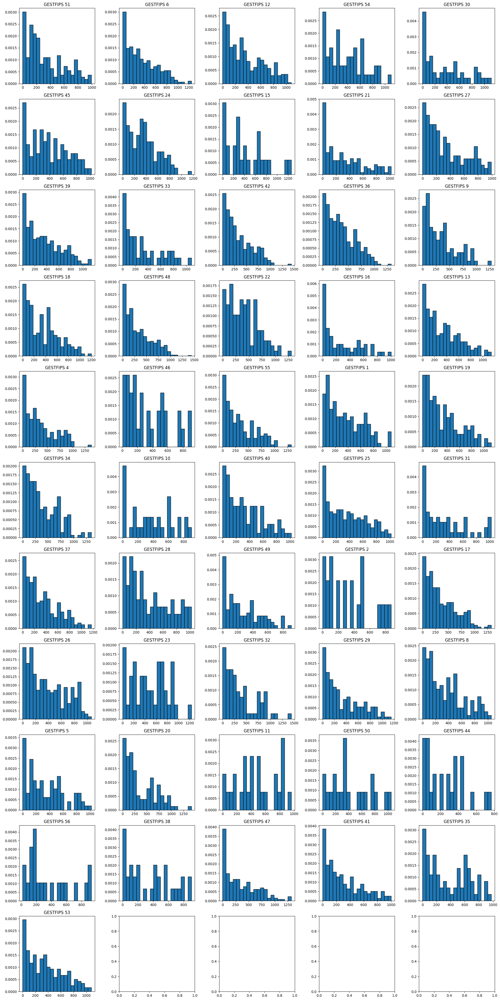

In [ ]:
import polars as pl
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'df' is your Polars DataFrame and it's already loaded with your data

# Get unique GESTFIPS values
unique_gestfips = alone_location.select("GESTFIPS").unique().to_numpy().flatten()

# Define the layout of your subplots
n_rows = 11
n_cols = 5
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 40)) # Adjust the figsize as needed

# Iterate over each unique GESTFIPS value and plot in subplot
for index, gestfips in enumerate(unique_gestfips):
    row = index // n_cols
    col = index % n_cols
    
    # Filter data for the current GESTFIPS
    df_filtered = alone_location.filter(pl.col("GESTFIPS") == gestfips)
    trtalone_values = df_filtered["TRTALONE"].to_numpy()
    
    # Plot histogram on the respective subplot
    axs[row, col].hist(trtalone_values, bins=20, edgecolor='k', density=True)
    axs[row, col].set_title(f'GESTFIPS {gestfips}')
    
    # Optional: Fit and plot a density curve over the histogram
    # This requires calculating the kernel density estimate (KDE) or another fitting procedure
    # For simplicity, this step is not shown here, but you can use scipy.stats or seaborn for KDE

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


In [ ]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# import polars as pl

# # Assuming 'df' is your Polars DataFrame

# # Get unique GESTFIPS values
# unique_gestfips = alone_location.select("GESTFIPS").unique().to_numpy().flatten()

# # Define the layout of your subplots
# n_rows = 11
# n_cols = 5
# fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 40))
# fig.subplots_adjust(hspace=0.4, wspace=0.4)

# # Determine global xlim
# global_min_trtalone = alone_location.select(pl.min("TRTALONE")).to_numpy().item()
# global_max_trtalone = alone_location.select(pl.max("TRTALONE")).to_numpy().item()

# # Example static ylim, adjust based on your data or calculation
# global_ylim = (0, 10)  # Placeholder, adjust as needed

# for index, gestfips in enumerate(unique_gestfips):
#     row = index // n_cols
#     col = index % n_cols
    
#     # Filter data for the current GESTFIPS
#     df_filtered = alone_location.filter(pl.col("GESTFIPS") == gestfips)
#     trtalone_values = df_filtered["TRTALONE"].to_numpy()
    
#     # Plotting the histogram with KDE
#     sns.histplot(trtalone_values, kde=True, ax=axs[row][col], binwidth=60, color="skyblue", linewidth=0, alpha=0.5, stat="probability")
#     # sns.kdeplot(trtalone_values, ax=axs[row][col], color="red", linewidth=2)
#     axs[row][col].set_title(f'GESTFIPS {gestfips}')
    
#     # Set the same xlim and ylim for all subplots
#     axs[row][col].set_xlim(global_min_trtalone, global_max_trtalone)
#     axs[row][col].set_ylim(0, 0.3)

# # Hide any unused subplots
# for index in range(n_gestfips, n_rows * n_cols):
#     row = index // n_cols
#     col = index % n_cols
#     axs[row][col].set_visible(False)

# plt.show()


In [ ]:
alone_location.select(pl.col("TRTALONE")).describe()

statistic,TRTALONE
str,f64
"""count""",8136.0
"""null_count""",0.0
"""mean""",345.1191
"""std""",283.180818
"""min""",0.0
"""25%""",105.0
"""50%""",280.0
"""75%""",545.0
"""max""",1440.0


/tmp/ipykernel_146/2012979984.py:15: DeprecationWarning: `groupby` is deprecated. It has been renamed to `group_by`.
  df_agg = df.groupby("PRTAGE_bin").agg(
/tmp/ipykernel_146/2012979984.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="PRTAGE_bin", y="Mean_TRTALONE", data=df_agg_pd, palette="Blues_d")


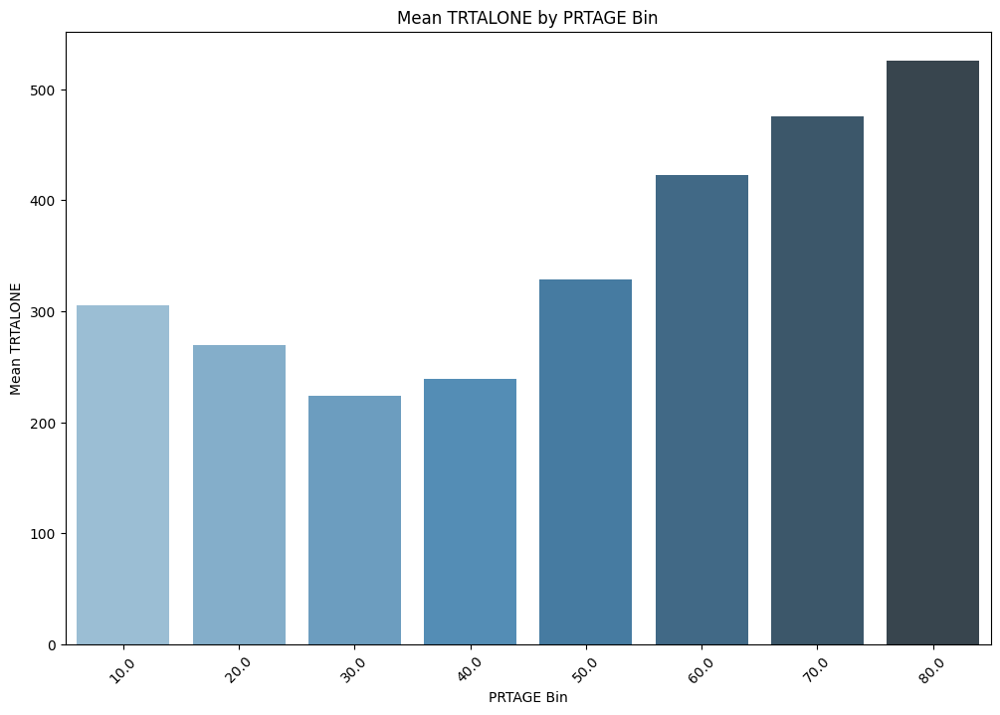

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import polars as pl
import numpy as np

# Assuming 'df' is your Polars DataFrame and it includes 'PRTAGE' and 'TRTALONE'

df = alone_location

# 1. Add a new column for PRTAGE bins
df = df.with_columns((
    (pl.col("PRTAGE") / 10).floor() * 10).alias("PRTAGE_bin"))

# 2. Calculate mean TRTALONE for each PRTAGE bin
df_agg = df.groupby("PRTAGE_bin").agg(
    pl.mean("TRTALONE").alias("Mean_TRTALONE")
)

# Convert the aggregated DataFrame back to pandas for plotting (if using seaborn)
df_agg_pd = df_agg.to_pandas()

# 3. Plotting
plt.figure(figsize=(12, 8))
sns.barplot(x="PRTAGE_bin", y="Mean_TRTALONE", data=df_agg_pd, palette="Blues_d")
plt.title("Mean TRTALONE by PRTAGE Bin")
plt.xlabel("PRTAGE Bin")
plt.ylabel("Mean TRTALONE")
plt.xticks(rotation=45)
plt.show()


In [ ]:
alone_location

TUCASEID,TRTALONE,TULINENO,TUFINLWGT,GESTFIPS,GTCO,PRTAGE,location
i64,i64,i64,f64,i64,i64,i64,str
20220101220017,110,1,3.1372e7,34,5,52,"""34-5"""
20220101220500,770,1,4.1333e7,25,17,30,"""25-17"""
20220101220504,350,1,5.7090e6,26,0,64,"""26-0"""
20220101220507,305,1,5.0246e6,6,59,60,"""6-59"""
20220101220552,182,1,1.2480e7,55,0,73,"""55-0"""
…,…,…,…,…,…,…,…
20221212222086,70,1,2.4181e7,36,59,44,"""36-59"""
20221212222264,65,1,1.4476e7,26,99,43,"""26-99"""
20221212222322,330,1,9.2667e6,30,0,64,"""30-0"""


/tmp/ipykernel_146/2604087202.py:36: DeprecationWarning: `groupby` is deprecated. It has been renamed to `group_by`.
  df_agg = df.groupby("PRTAGE_bin").agg(
/tmp/ipykernel_146/2604087202.py:36: DeprecationWarning: `groupby` is deprecated. It has been renamed to `group_by`.
  df_agg = df.groupby("PRTAGE_bin").agg(
/tmp/ipykernel_146/2604087202.py:36: DeprecationWarning: `groupby` is deprecated. It has been renamed to `group_by`.
  df_agg = df.groupby("PRTAGE_bin").agg(
/tmp/ipykernel_146/2604087202.py:36: DeprecationWarning: `groupby` is deprecated. It has been renamed to `group_by`.
  df_agg = df.groupby("PRTAGE_bin").agg(
/tmp/ipykernel_146/2604087202.py:36: DeprecationWarning: `groupby` is deprecated. It has been renamed to `group_by`.
  df_agg = df.groupby("PRTAGE_bin").agg(
/tmp/ipykernel_146/2604087202.py:36: DeprecationWarning: `groupby` is deprecated. It has been renamed to `group_by`.
  df_agg = df.groupby("PRTAGE_bin").agg(
/tmp/ipykernel_146/2604087202.py:36: DeprecationWarn

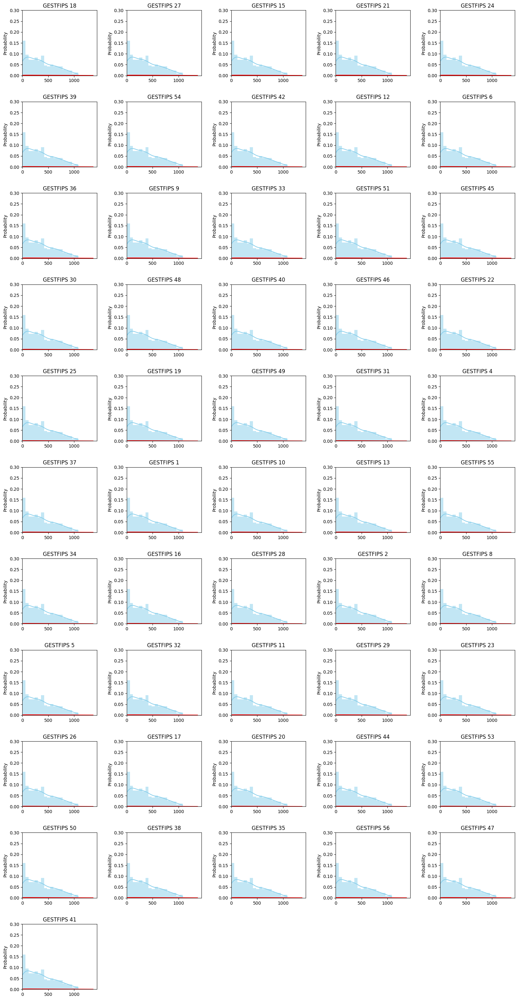

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import polars as pl

# Assuming 'df' is your Polars DataFrame

# Get unique GESTFIPS values
unique_gestfips = alone_location.select("GESTFIPS").unique().to_numpy().flatten()

# Define the layout of your subplots
n_rows = 11
n_cols = 5
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 40))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Determine global xlim
global_min_trtalone = alone_location.select(pl.min("TRTALONE")).to_numpy().item()
global_max_trtalone = alone_location.select(pl.max("TRTALONE")).to_numpy().item()

# Example static ylim, adjust based on your data or calculation
global_ylim = (0, 10)  # Placeholder, adjust as needed

for index, gestfips in enumerate(unique_gestfips):
    row = index // n_cols
    col = index % n_cols
    
    # Filter data for the current GESTFIPS
    df_filtered = alone_location.filter(pl.col("GESTFIPS") == gestfips)
    # trtalone_values = df_filtered["TRTALONE"].to_numpy()
   
    df = df_filtered.with_columns(
    ((pl.col("PRTAGE") / 10).floor() * 10).alias("PRTAGE_bin")
    )

    # 2. Calculate mean TRTALONE for each PRTAGE bin
    df_agg = df.groupby("PRTAGE_bin").agg(
    pl.mean("TRTALONE").alias("Mean_TRTALONE")
    )

    
    # Plotting the histogram with KDE
    sns.histplot(trtalone_values, kde=True, ax=axs[row][col], binwidth=60, color="skyblue", linewidth=0, alpha=0.5, stat="probability")
    sns.kdeplot(trtalone_values, ax=axs[row][col], color="red", linewidth=2)
    axs[row][col].set_title(f'GESTFIPS {gestfips}')
    
    # Set the same xlim and ylim for all subplots
    axs[row][col].set_xlim(global_min_trtalone, global_max_trtalone)
    axs[row][col].set_ylim(0, 0.3)

# Hide any unused subplots
for index in range(n_gestfips, n_rows * n_cols):
    row = index // n_cols
    col = index % n_cols
    axs[row][col].set_visible(False)

plt.show()


<AxesSubplot: xlabel='PRTAGE', ylabel='TRTALONE'>

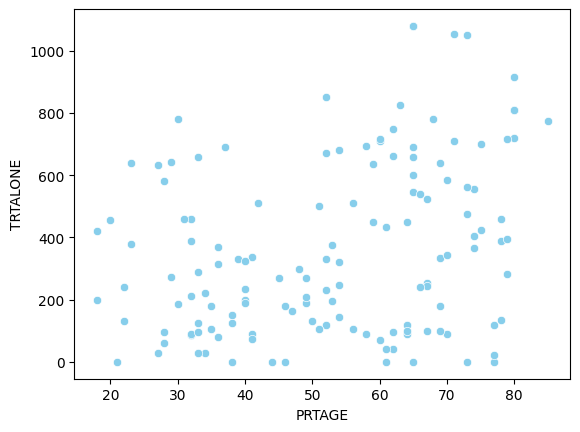

In [ ]:
df_filtered = alone_location.filter(pl.col("GESTFIPS") == 1)
df_filtered
df = df_filtered.with_columns(
    ((pl.col("PRTAGE") / 5).floor() * 5).alias("PRTAGE_bin")
    )
df
sns.scatterplot(x="PRTAGE", y="TRTALONE", data = df, color="skyblue")

In [ ]:
df.select(pl.col("PRTAGE_bin")).unique()

PRTAGE_bin
f64
80.0
45.0
35.0
60.0
30.0
…
70.0
50.0
15.0


<AxesSubplot: xlabel='PRTAGE_bin', ylabel='TRTALONE'>

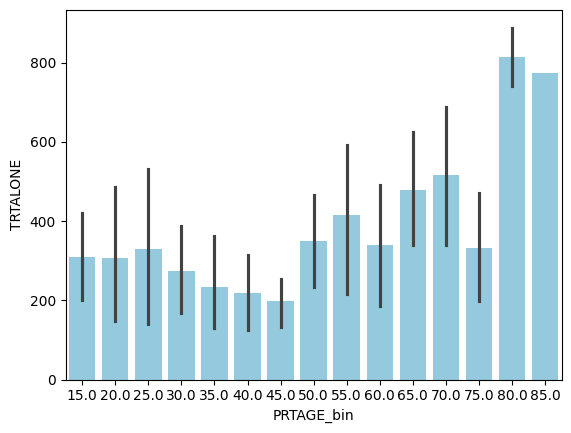

In [ ]:
sns.barplot(x="PRTAGE_bin", y="TRTALONE", data = df, color="skyblue")


<AxesSubplot: xlabel='PRTAGE_bin', ylabel='TRTALONE'>

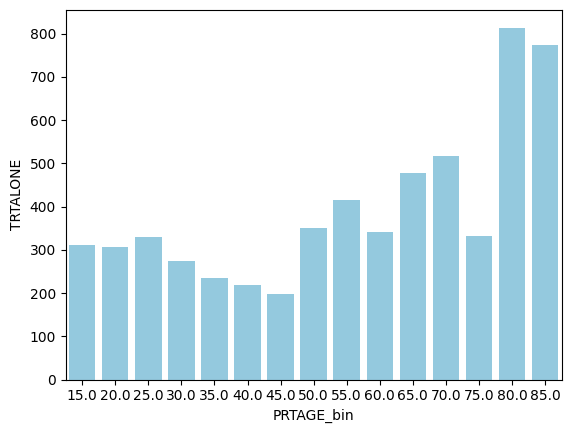

In [ ]:
# n_rows = 2
# n_cols = 1
# fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 40))

df_filtered = alone_location.filter(pl.col("GESTFIPS") == 1)
df_filtered
df = df_filtered.with_columns(
    ((pl.col("PRTAGE") / 5).floor() * 5).alias("PRTAGE_bin")
    )
df
sns.barplot(x="PRTAGE_bin", y="TRTALONE", data = df, color="skyblue", errorbar=None)
# sns.lmplot(x="PRTAGE_bin", y="TRTALONE", data=df,
#            order=2, ci=None)
           

<AxesSubplot: >

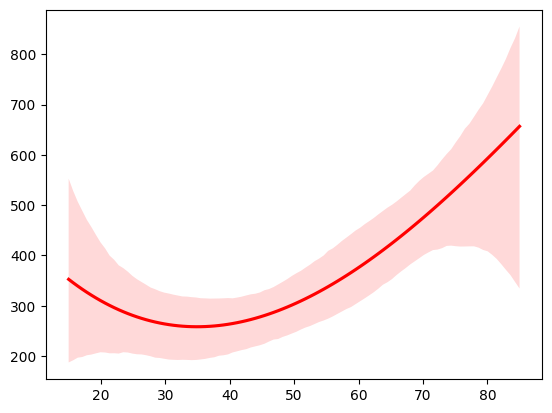

In [ ]:
sns.regplot(x='PRTAGE_bin', y='TRTALONE', data=df, scatter=False, color='red', order=3)


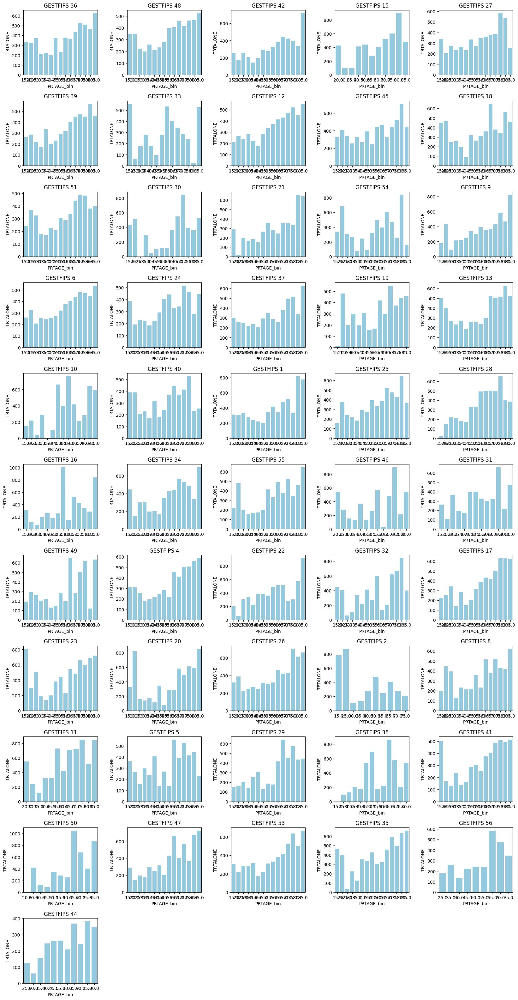

In [ ]:
#Binned by 5 with arbitary printing

import seaborn as sns
import matplotlib.pyplot as plt
import polars as pl

# Assuming 'df' is your Polars DataFrame

# Get unique GESTFIPS values
unique_gestfips = alone_location.select("GESTFIPS").unique().to_numpy().flatten()

# Define the layout of your subplots
n_rows = 11
n_cols = 5
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 40))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Determine global xlim
# global_min_trtalone = alone_location.select(pl.min("TRTALONE")).to_numpy().item()
# global_max_trtalone = alone_location.select(pl.max("TRTALONE")).to_numpy().item()

# Example static ylim, adjust based on your data or calculation
# global_ylim = (0, 10)  # Placeholder, adjust as needed

for index, gestfips in enumerate(unique_gestfips):
    row = index // n_cols
    col = index % n_cols
    
    # Filter data for the current GESTFIPS
    df_filtered = alone_location.filter(pl.col("GESTFIPS") == gestfips)
    trtalone_values = df_filtered["TRTALONE"].to_numpy()
    
    df = df_filtered.with_columns(
        ((pl.col("PRTAGE") / 5).floor() * 5).alias("PRTAGE_bin")
        )
    df
    sns.barplot(x="PRTAGE_bin", y="TRTALONE", data = df, color="skyblue", errorbar=None, ax=axs[row][col])

    # Plotting the histogram with KDE
    # sns.histplot(trtalone_values, kde=True, ax=axs[row][col], binwidth=60, color="skyblue", linewidth=0, alpha=0.5, stat="probability")
    # sns.kdeplot(trtalone_values, ax=axs[row][col], color="red", linewidth=2)
    axs[row][col].set_title(f'GESTFIPS {gestfips}')
    
    # Set the same xlim and ylim for all subplots
    # axs[row][col].set_xlim(global_min_trtalone, global_max_trtalone)
    # axs[row][col].set_ylim(0, 800)

# Hide any unused subplots
for index in range(n_gestfips, n_rows * n_cols):
    row = index // n_cols
    col = index % n_cols
    axs[row][col].set_visible(False)

plt.show()


In [ ]:
alone_location.group_by(pl.col("GESTFIPS")).count().sort(by="count")
states_by_sample = alone_location.group_by(pl.col("GESTFIPS")).count().sort(by="count").select(pl.col("GESTFIPS"))
states_by_sample

/tmp/ipykernel_146/1351303466.py:1: DeprecationWarning: `count` is deprecated. It has been renamed to `len`.
  alone_location.group_by(pl.col("GESTFIPS")).count().sort(by="count")
/tmp/ipykernel_146/1351303466.py:2: DeprecationWarning: `count` is deprecated. It has been renamed to `len`.
  states_by_sample = alone_location.group_by(pl.col("GESTFIPS")).count().sort(by="count").select(pl.col("GESTFIPS"))


GESTFIPS
i64
50
56
2
44
15
…
42
36
12


In [ ]:
alone_location.group_by(pl.col("GESTFIPS")).count().sort(by="count").filter(pl.col("GESTFIPS")==1)

/tmp/ipykernel_146/563160760.py:1: DeprecationWarning: `count` is deprecated. It has been renamed to `len`.
  alone_location.group_by(pl.col("GESTFIPS")).count().sort(by="count").filter(pl.col("GESTFIPS")==1)


GESTFIPS,count
i64,u32
1,138


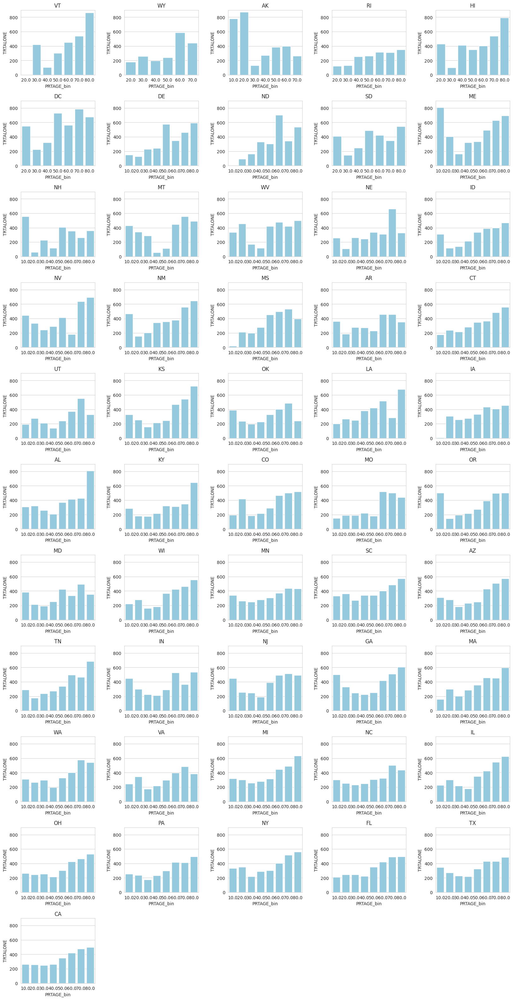

In [ ]:
#Binned by 10 and with print by ascending sample size

import seaborn as sns
import matplotlib.pyplot as plt
import polars as pl
sns.set_style("whitegrid")


# Assuming 'df' is your Polars DataFrame

# Get unique GESTFIPS values
unique_gestfips = states_by_sample.to_numpy().flatten()

# Define the layout of your subplots
n_rows = 11
n_cols = 5
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 40))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Determine global xlim
# global_min_trtalone = alone_location.select(pl.min("TRTALONE")).to_numpy().item()
# global_max_trtalone = alone_location.select(pl.max("TRTALONE")).to_numpy().item()

# Example static ylim, adjust based on your data or calculation
# global_ylim = (0, 10)  # Placeholder, adjust as needed

for index, gestfips in enumerate(unique_gestfips):
    row = index // n_cols
    col = index % n_cols
    
    # Filter data for the current GESTFIPS
    df_filtered = alone_location.filter(pl.col("GESTFIPS") == gestfips)
    trtalone_values = df_filtered["TRTALONE"].to_numpy()
    
    df = df_filtered.with_columns(
        ((pl.col("PRTAGE") / 10).floor() * 10).alias("PRTAGE_bin")
        )
    df
    sns.barplot(x="PRTAGE_bin", y="TRTALONE", data = df, color="skyblue", errorbar=None, ax=axs[row][col])

    # Plotting the histogram with KDE
    # sns.histplot(trtalone_values, kde=True, ax=axs[row][col], binwidth=60, color="skyblue", linewidth=0, alpha=0.5, stat="probability")
    # sns.kdeplot(trtalone_values, ax=axs[row][col], color="red", linewidth=2)
    state = gestfips_state_data.get(gestfips)
    axs[row][col].set_title(f'{state}')

    # Set the same xlim and ylim for all subplots
    # axs[row][col].set_xlim(0, 80)
    axs[row][col].set_ylim(0, 900)


# Hide any unused subplots
for index in range(n_gestfips, n_rows * n_cols):
    row = index // n_cols
    col = index % n_cols
    axs[row][col].set_visible(False)

plt.show()


In [ ]:
alone_location_hours = alone_location.with_columns(((pl.col("TRTALONE")/60).round(2)).alias("TRTALONE_HR"))
alone_location_hours

TUCASEID,TRTALONE,TULINENO,TUFINLWGT,GESTFIPS,GTCO,PRTAGE,location,TRTALONE_HR
i64,i64,i64,f64,i64,i64,i64,str,f64
20220101220017,110,1,3.1372e7,34,5,52,"""34-5""",1.83
20220101220500,770,1,4.1333e7,25,17,30,"""25-17""",12.83
20220101220504,350,1,5.7090e6,26,0,64,"""26-0""",5.83
20220101220507,305,1,5.0246e6,6,59,60,"""6-59""",5.08
20220101220552,182,1,1.2480e7,55,0,73,"""55-0""",3.03
…,…,…,…,…,…,…,…,…
20221212222086,70,1,2.4181e7,36,59,44,"""36-59""",1.17
20221212222264,65,1,1.4476e7,26,99,43,"""26-99""",1.08
20221212222322,330,1,9.2667e6,30,0,64,"""30-0""",5.5


In [ ]:
df_filteredtest = alone_location_hours.filter(pl.col("GESTFIPS") == 1)
trtalone_values = df_filteredtest["TRTALONE_HR"].to_numpy()
    
df = df_filteredtest.with_columns(
    ((pl.col("PRTAGE") / 10).floor() * 10).alias("PRTAGE_bin")
    )
df

TUCASEID,TRTALONE,TULINENO,TUFINLWGT,GESTFIPS,GTCO,PRTAGE,location,TRTALONE_HR,PRTAGE_bin
i64,i64,i64,f64,i64,i64,i64,str,f64,f64
20220101221028,180,1,1.0265e7,1,0,46,"""1-0""",3.0,40.0
20220101221795,640,1,7.5407e6,1,0,23,"""1-0""",10.67,20.0
20220101222094,330,1,7.8489e6,1,0,52,"""1-0""",5.5,50.0
20220111210559,60,1,4.8704e6,1,0,28,"""1-0""",1.0,20.0
20220111211348,420,1,6.6595e6,1,3,18,"""1-3""",7.0,10.0
…,…,…,…,…,…,…,…,…,…
20221211221798,125,1,7.5973e6,1,97,38,"""1-97""",2.08,30.0
20221211222112,30,1,8.4597e6,1,0,33,"""1-0""",0.5,30.0
20221211222146,632,1,1.5311e7,1,0,27,"""1-0""",10.53,20.0


In [ ]:
alone_location.group_by(pl.col("GESTFIPS")).count().sort(by="count", descending=True)

/tmp/ipykernel_146/604473614.py:1: DeprecationWarning: `count` is deprecated. It has been renamed to `len`.
  alone_location.group_by(pl.col("GESTFIPS")).count().sort(by="count", descending=True)


GESTFIPS,count
i64,u32
6,754
48,596
12,426
36,373
42,316
…,…
15,26
44,25
2,22


/tmp/ipykernel_146/419032626.py:44: DeprecationWarning: `groupby` is deprecated. It has been renamed to `group_by`.
  data_points_per_gestfips = alone_location_hours.groupby("GESTFIPS").agg(pl.count("TRTALONE_HR").alias("data_points"))


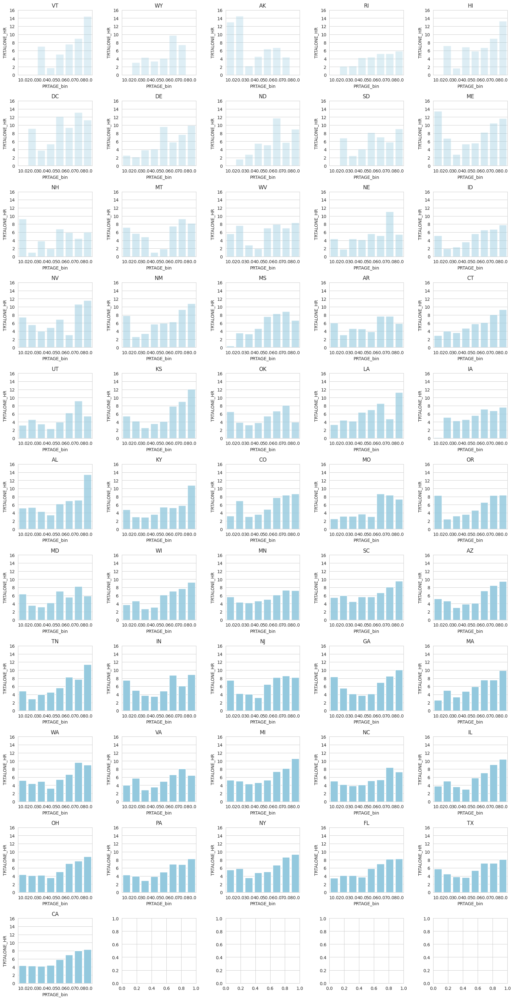

In [ ]:
#Binned by 10 and with print by ascending sample size by hour

import seaborn as sns
import matplotlib.pyplot as plt
import polars as pl
sns.set_style("whitegrid")

# Assuming 'df' is your Polars DataFrame

# Get unique GESTFIPS values
unique_gestfips = states_by_sample.to_numpy().flatten()

# Define the layout of your subplots
n_rows = 11
n_cols = 5
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 40))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Determine global xlim
# global_min_trtalone = alone_location.select(pl.min("TRTALONE")).to_numpy().item()
# global_max_trtalone = alone_location.select(pl.max("TRTALONE")).to_numpy().item()

# Example static ylim, adjust based on your data or calculation
# global_ylim = (0, 10)  # Placeholder, adjust as needed

# def calculate_alpha(num_data_points, min_data_points, max_data_points, min_alpha=0.2, max_alpha=1.0):
#     if max_data_points == min_data_points:
#         return max_alpha
#     return min_alpha + (float(num_data_points) - min_data_points) / (max_data_points - min_data_points) * (max_alpha - min_alpha)

def calculate_alpha(num_data_points, min_data_points=21, max_data_points=754, threshold=200,  min_alpha=0.3, max_alpha=1.0):
    if num_data_points > 200:
        # print("yes")
        return max_alpha

    else:
        # Scale alpha linearly in the range [min_data_points, threshold]
        alpha_range = max_alpha - min_alpha
        scaled_value = (num_data_points - min_data_points) / (threshold - min_data_points) 
        # print(f'({num_data_points} - {min_data_points}) / ({threshold} - {min_data_points})')
        return min_alpha + scaled_value * (max_alpha - min_alpha)

# Calculate the number of data points for each GESTFIPS
data_points_per_gestfips = alone_location_hours.groupby("GESTFIPS").agg(pl.count("TRTALONE_HR").alias("data_points"))

# Find the min and max number of data points to scale alpha values
min_data_points = data_points_per_gestfips.select(pl.min("data_points")).to_numpy().item()
max_data_points = data_points_per_gestfips.select(pl.max("data_points")).to_numpy().item()

#convert to hours:

for index, gestfips in enumerate(unique_gestfips):
    row = index // n_cols
    col = index % n_cols
    
    # Filter data for the current GESTFIPS
    df_filtered = alone_location_hours.filter(pl.col("GESTFIPS") == gestfips)
    trtalone_values = df_filtered["TRTALONE_HR"].to_numpy()

    num_data_points = df_filtered.shape[0]
    alpha_value = calculate_alpha(num_data_points, min_data_points, max_data_points=max_data_points)
    # print(num_data_points)
    # print(alpha_value)

    
    df = df_filtered.with_columns(
        ((pl.col("PRTAGE") / 10).floor() * 10).alias("PRTAGE_bin")
        )
    
    bins = [10.0, 20.0, 30.0, 40.0, 50.0, 60.0, 70.0, 80.0]
    sns.barplot(x="PRTAGE_bin", y="TRTALONE_HR", data = df, color="skyblue", errorbar=None, alpha=alpha_value, ax=axs[row][col], order=bins)

    # Plotting the histogram with KDE
    # sns.histplot(trtalone_values, kde=True, ax=axs[row][col], binwidth=60, color="skyblue", linewidth=0, alpha=0.5, stat="probability")
    # sns.kdeplot(trtalone_values, ax=axs[row][col], color="red", linewidth=2)
    state = gestfips_state_data.get(gestfips)
    axs[row][col].set_title(f'{state}')

    # Set the same xlim and ylim for all subplots
    # bins = [10.0, 20.0, 30.0, 40.0, 50.0, 60.0, 70.0, 80.0]

    # axs[row][col].set_xlim(-0.5, 7)
    axs[row][col].set_ylim(0, 15)
    axs[row][col].set_yticks([0, 2, 4, 6, 8, 10, 12, 14, 16])

plt.savefig("plot3.svg", format="svg")
plt.show()




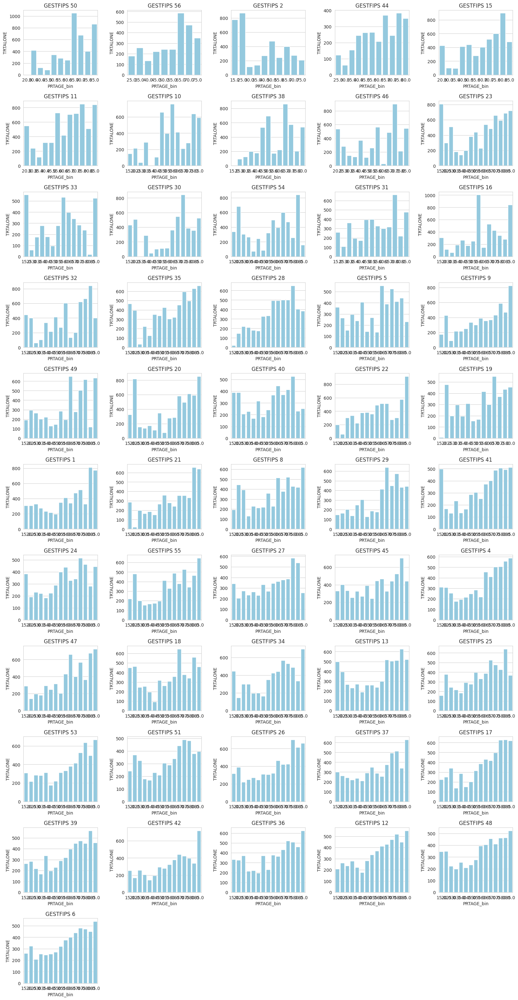

In [ ]:
#Binned by 5 and with print by ascending sample size

import seaborn as sns
import matplotlib.pyplot as plt
import polars as pl

# Assuming 'df' is your Polars DataFrame

# Get unique GESTFIPS values
unique_gestfips = states_by_sample.to_numpy().flatten()

# Define the layout of your subplots
n_rows = 11
n_cols = 5
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 40))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Determine global xlim
# global_min_trtalone = alone_location.select(pl.min("TRTALONE")).to_numpy().item()
# global_max_trtalone = alone_location.select(pl.max("TRTALONE")).to_numpy().item()

# Example static ylim, adjust based on your data or calculation
# global_ylim = (0, 10)  # Placeholder, adjust as needed

for index, gestfips in enumerate(unique_gestfips):
    row = index // n_cols
    col = index % n_cols
    
    # Filter data for the current GESTFIPS
    df_filtered = alone_location.filter(pl.col("GESTFIPS") == gestfips)
    trtalone_values = df_filtered["TRTALONE"].to_numpy()
    
    df = df_filtered.with_columns(
        ((pl.col("PRTAGE") / 5).floor() * 5).alias("PRTAGE_bin")
        )
    df
    sns.barplot(x="PRTAGE_bin", y="TRTALONE", data = df, color="skyblue", errorbar=None, ax=axs[row][col])

    # Plotting the histogram with KDE
    # sns.histplot(trtalone_values, kde=True, ax=axs[row][col], binwidth=60, color="skyblue", linewidth=0, alpha=0.5, stat="probability")
    # sns.kdeplot(trtalone_values, ax=axs[row][col], color="red", linewidth=2)
    axs[row][col].set_title(f'GESTFIPS {gestfips}')
    
    # Set the same xlim and ylim for all subplots
    # axs[row][col].set_xlim(global_min_trtalone, global_max_trtalone)
    # axs[row][col].set_ylim(0, 800)

# Hide any unused subplots
for index in range(n_gestfips, n_rows * n_cols):
    row = index // n_cols
    col = index % n_cols
    axs[row][col].set_visible(False)

plt.show()


/shared-libs/python3.9/py/lib/python3.9/site-packages/seaborn/algorithms.py:100: RankWarning: Polyfit may be poorly conditioned
  boot_dist.append(f(*sample, **func_kwargs))
/shared-libs/python3.9/py/lib/python3.9/site-packages/seaborn/algorithms.py:100: RankWarning: Polyfit may be poorly conditioned
  boot_dist.append(f(*sample, **func_kwargs))
/shared-libs/python3.9/py/lib/python3.9/site-packages/seaborn/algorithms.py:100: RankWarning: Polyfit may be poorly conditioned
  boot_dist.append(f(*sample, **func_kwargs))


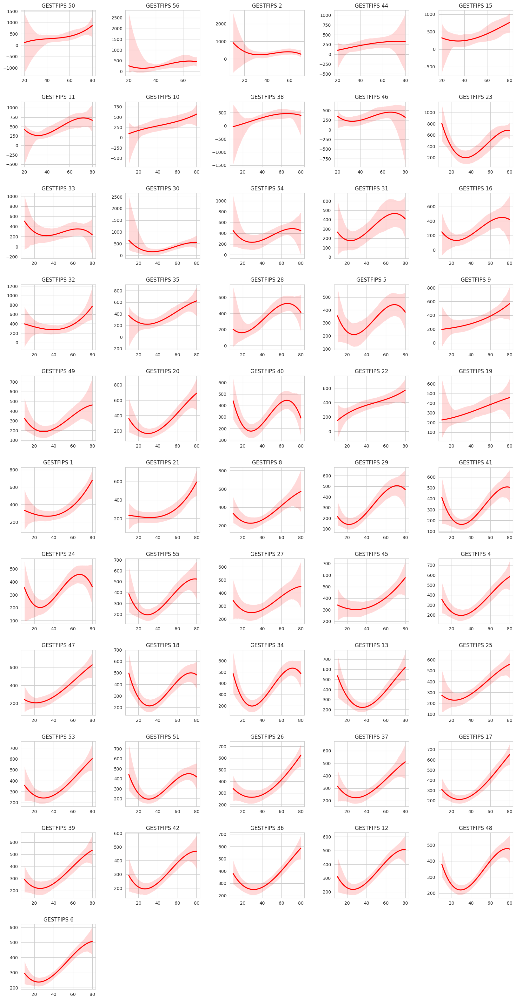

In [ ]:
#Regplot and with print by ascending sample size

import seaborn as sns
import matplotlib.pyplot as plt
import polars as pl

# Assuming 'df' is your Polars DataFrame

# Get unique GESTFIPS values
unique_gestfips = states_by_sample.to_numpy().flatten()

# Define the layout of your subplots
n_rows = 11
n_cols = 5
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 40))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Determine global xlim
# global_min_trtalone = alone_location.select(pl.min("TRTALONE")).to_numpy().item()
# global_max_trtalone = alone_location.select(pl.max("TRTALONE")).to_numpy().item()

# Example static ylim, adjust based on your data or calculation
# global_ylim = (0, 10)  # Placeholder, adjust as needed

for index, gestfips in enumerate(unique_gestfips):
    row = index // n_cols
    col = index % n_cols
    
    # Filter data for the current GESTFIPS
    df_filtered = alone_location.filter(pl.col("GESTFIPS") == gestfips)
    trtalone_values = df_filtered["TRTALONE"].to_numpy()
    
    df = df_filtered.with_columns(
        ((pl.col("PRTAGE") / 10).floor() * 10).alias("PRTAGE_bin")
        )
    df

    sns.regplot(x='PRTAGE_bin', y='TRTALONE', data=df, scatter=False, color='red', order=3, ax=axs[row][col])


    # Plotting the histogram with KDE
    # sns.histplot(trtalone_values, kde=True, ax=axs[row][col], binwidth=60, color="skyblue", linewidth=0, alpha=0.5, stat="probability")
    # sns.kdeplot(trtalone_values, ax=axs[row][col], color="red", linewidth=2)
    axs[row][col].set_title(f'GESTFIPS {gestfips}')
    
    # Set the same xlim and ylim for all subplots
    # axs[row][col].set_xlim(global_min_trtalone, global_max_trtalone)
    # axs[row][col].set_ylim(0, 800)

# Hide any unused subplots
for index in range(n_gestfips, n_rows * n_cols):
    row = index // n_cols
    col = index % n_cols
    axs[row][col].set_visible(False)

plt.show()


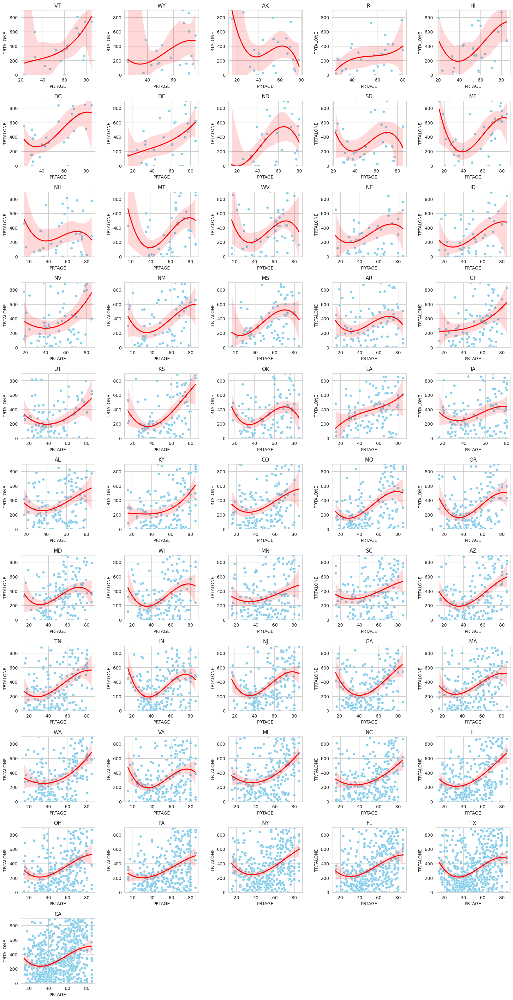

In [ ]:
#Scatter and with print by ascending sample size

import seaborn as sns
import matplotlib.pyplot as plt
import polars as pl

# Assuming 'df' is your Polars DataFrame

# Get unique GESTFIPS values
unique_gestfips = states_by_sample.to_numpy().flatten()

# Define the layout of your subplots
n_rows = 11
n_cols = 5
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 40))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Determine global xlim
# global_min_trtalone = alone_location.select(pl.min("TRTALONE")).to_numpy().item()
# global_max_trtalone = alone_location.select(pl.max("TRTALONE")).to_numpy().item()

# Example static ylim, adjust based on your data or calculation
# global_ylim = (0, 10)  # Placeholder, adjust as needed

for index, gestfips in enumerate(unique_gestfips):
    row = index // n_cols
    col = index % n_cols
    
    # Filter data for the current GESTFIPS
    df_filtered = alone_location.filter(pl.col("GESTFIPS") == gestfips)
    trtalone_values = df_filtered["TRTALONE"].to_numpy()
    
    df = df_filtered.with_columns(
        ((pl.col("PRTAGE") / 10).floor() * 10).alias("PRTAGE_bin")
        )
    sns.scatterplot(x="PRTAGE", y="TRTALONE", data = df, color="skyblue", ax=axs[row][col])
    sns.regplot(x='PRTAGE', y='TRTALONE', data=df, scatter=False, color='red', order=3, ax=axs[row][col])

    # Plotting the histogram with KDE
    # sns.histplot(trtalone_values, kde=True, ax=axs[row][col], binwidth=60, color="skyblue", linewidth=0, alpha=0.5, stat="probability")
    # sns.kdeplot(trtalone_values, ax=axs[row][col], color="red", linewidth=2)
    state = gestfips_state_data.get(gestfips)
    axs[row][col].set_title(f'{state}')
    
    # Set the same xlim and ylim for all subplots
    # axs[row][col].set_xlim(global_min_trtalone, global_max_trtalone)
    axs[row][col].set_ylim(0, 900)

# Hide any unused subplots
for index in range(n_gestfips, n_rows * n_cols):
    row = index // n_cols
    col = index % n_cols
    axs[row][col].set_visible(False)

plt.show()


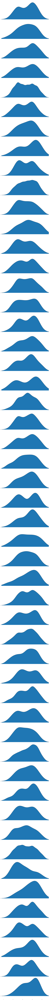

In [ ]:
#joyplot state
df = alone_location.with_columns(
    ((pl.col("PRTAGE") / 10).floor() * 10).alias("PRTAGE_bin")
    )

df_pd = df.to_pandas()
    
fig, axes = joypy.joyplot(df_pd, by='GESTFIPS', column="PRTAGE_bin", figsize=(15,300))
fig.savefig('test3png2.png', dpi=200)

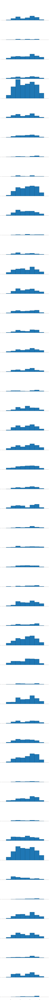

In [ ]:
#joyplot state
# df = alone_location.with_columns(
#     ((pl.col("PRTAGE") / 10).floor() * 10).alias("PRTAGE_bin")
#     )

df_pd = alone_location.to_pandas()
    
fig, axes = joypy.joyplot(df_pd, by='GESTFIPS', column="PRTAGE", hist=True, bins=10, figsize=(15,300))
fig.savefig('test3png2.png', dpi=200)

<AxesSubplot: xlabel='PRTAGE_bin', ylabel='TRTALONE'>

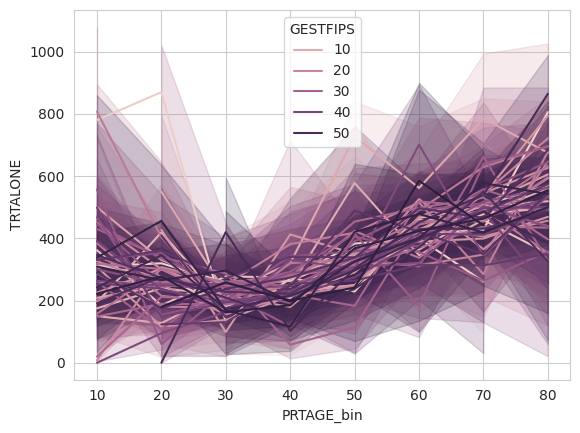

In [ ]:
df = alone_location.with_columns(
    ((pl.col("PRTAGE") / 10).floor() * 10).alias("PRTAGE_bin")
    )
sns.lineplot(data = df, x="PRTAGE_bin", y='TRTALONE', hue="GESTFIPS")

In [ ]:
resp_multi = pl.read_csv("/work/Loneliness/atusresp_0322.dat", infer_schema_length=100000)



In [ ]:
resp_multi.columns

['TUCASEID',
 'TULINENO',
 'TESPUHRS',
 'TRDTIND1',
 'TRDTOCC1',
 'TRERNHLY',
 'TRERNUPD',
 'TRHERNAL',
 'TRHHCHILD',
 'TRIMIND1',
 'TRMJIND1',
 'TRMJOCC1',
 'TRMJOCGR',
 'TRNHHCHILD',
 'TRNUMHOU',
 'TROHHCHILD',
 'TRTALONE',
 'TRTCC',
 'TRTHHFAMILY',
 'TRTNOCHILD',
 'TRTNOHH',
 'TRTO',
 'TRTOHH',
 'TRTOHHCHILD',
 'TRTONHH',
 'TRTONHHCHILD',
 'TRTSPONLY',
 'TRTSPOUSE',
 'TRTUNMPART',
 'TRWERNAL',
 'TTHR',
 'TTOT',
 'TTWK',
 'TUABSOT',
 'TUYEAR',
 'TEABSRSN',
 'TEERN',
 'TEERNH1O',
 'TEERNH2',
 'TEERNHRO',
 'TEERNHRY',
 'TEERNPER',
 'TEERNRT',
 'TEERNUOT',
 'TEERNWKP',
 'TEHRFTPT',
 'TEHRUSL1',
 'TEHRUSL2',
 'TEIO1COW',
 'TEIO1ICD',
 'TEIO1OCD',
 'TELAYAVL',
 'TELAYLK',
 'TELKAVL',
 'TELKM1',
 'TERET1',
 'TESCHFT',
 'TUBUS',
 'TUBUS1',
 'TUBUS2OT',
 'TUBUSL1',
 'TUBUSL2',
 'TUBUSL3',
 'TUBUSL4',
 'TUCC2',
 'TUCC4',
 'TUFWK',
 'TUIO1MFG',
 'TUIODP1',
 'TUIODP2',
 'TUIODP3',
 'TULAY',
 'TULAY6M',
 'TULAYAVR',
 'TULAYDT',
 'TULK',
 'TULKAVR',
 'TULKDK1',
 'TULKDK2',
 'TULKDK3',
 'TULKDK4',

In [ ]:
resp_multi[['TUCASEID', "TRTALONE"]]
resp_multi_year = resp_multi.with_columns(pl.col("TUCASEID").cast(pl.Utf8).str.slice(0, 4).cast(pl.Int32).alias("year"))
resp_multi_year_filtered = resp_multi_year[["TUCASEID", "TRTALONE", "year"]]

In [ ]:
test = resp_multi_year_filtered.filter(pl.col("year")==2003)
test2 = resp_multi_year_filtered.filter(pl.col("year")==2004)
test3 = resp_multi_year_filtered.filter(pl.col("year")==2022)

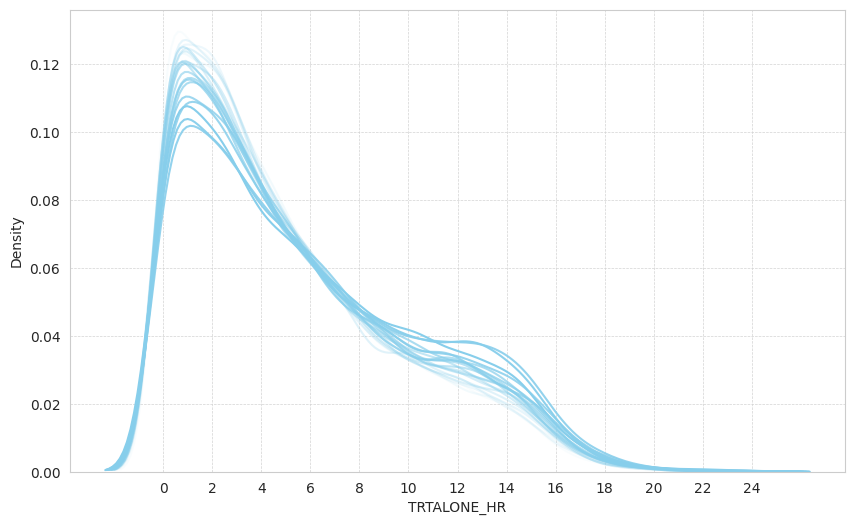

In [ ]:
import seaborn as sns
resp_multi_year_filtered = resp_multi_year_filtered.with_columns(((pl.col("TRTALONE")/60).round(2)).alias("TRTALONE_HR"))
# Create a list of years from 2003 to 2022
years = np.arange(2003, 2023)

# Prepare the plot
plt.figure(figsize=(10, 6))

# Calculate alpha increment
alpha_increment = 1 / len(years)
alphas = np.arange(0 + alpha_increment, 1 + alpha_increment, alpha_increment)

# Loop through each year, progressively increasing the alpha
for year, alpha in zip(years, alphas):
    sns.kdeplot(data=resp_multi_year_filtered.filter(pl.col('year') == year), 
    x='TRTALONE_HR', 
    common_norm=False, 
    label=str(year),
    alpha=alpha,
    color="skyblue")
plt.xticks(range(0, int(resp_multi_year_filtered['TRTALONE_HR'].max()) + 1, 2))
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgrey')

plt.show()


In [ ]:
resp_multi_year

TUCASEID,TULINENO,TESPUHRS,TRDTIND1,TRDTOCC1,TRERNHLY,TRERNUPD,TRHERNAL,TRHHCHILD,TRIMIND1,TRMJIND1,TRMJOCC1,TRMJOCGR,TRNHHCHILD,TRNUMHOU,TROHHCHILD,TRTALONE,TRTCC,TRTHHFAMILY,TRTNOCHILD,TRTNOHH,TRTO,TRTOHH,TRTOHHCHILD,TRTONHH,TRTONHHCHILD,TRTSPONLY,TRTSPOUSE,TRTUNMPART,TRWERNAL,TTHR,TTOT,TTWK,TUABSOT,TUYEAR,TEABSRSN,TEERN,…,TRTHH,TUDIS2,TURETOT,TUSPABS,TUSPUSFT,TUSPWK,TREMODR,TUCC9,TUDIARYDATE,TUDIS,TUDIS1,TRCHILDNUM,TUDIARYDAY,TRERNWA,TRHOLIDAY,TRSPFTPT,TRSPPRES,TRDPFTPT,TUFNWGTP,TESPEMPNOT,TESCHLVL,TESCHENR,TEMJOT,TELFS,TEHRUSLT,TRYHHCHILD,TRWBMODR,TRTALONE_WK,TRTCCC_WK,TRLVMODR,TRTEC,TUECYTD,TUELDER,TUELFREQ,TUELNUM,TU20FWGT,year
i64,i64,f64,i64,i64,f64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,…,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,f64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,f64,i32
20030100013280,1,-1.0,40,8,2200.0,1,1,2,15,10,2,1,2,3,2,525,0,5,0,-1,-1,-1,0,-1,0,5,5,0,1,0,0,0,1,2003,4,-1,…,-1,-1,-1,3,-1,2,-1,-1,20030103,-1,-1,0,6,66000,0,-1,1,2,8.1555e6,2,-1,-1,2,2,30,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0,2003
20030100013344,1,50.0,16,16,-1.0,1,-1,1,5,4,4,3,2,4,1,0,170,760,530,-1,-1,-1,760,-1,0,0,760,0,1,0,0,0,-1,2003,-1,-1,…,-1,-1,-1,-1,-1,1,-1,-1,20030104,-1,-1,2,7,20000,0,1,1,2,1.7353e6,1,-1,2,2,1,30,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0,2003
20030100013352,1,-1.0,43,15,1250.0,0,0,2,16,10,3,2,2,2,2,475,0,60,0,-1,-1,-1,0,-1,0,60,60,0,0,0,0,0,1,2003,4,-1,…,-1,-1,-1,2,-1,2,-1,-1,20030104,-1,-1,0,7,20000,0,-1,1,2,3.8305e6,2,-1,2,2,2,12,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0,2003
20030100013848,1,40.0,-1,-1,-1.0,-1,-1,1,-1,-1,-1,-1,2,4,1,350,715,335,0,-1,-1,-1,70,-1,0,265,305,0,-1,0,0,0,2,2003,-1,-1,…,-1,-1,-1,-1,-1,1,-1,-1,20030102,-1,-1,2,5,-1,0,1,1,-1,6.6220e6,1,-1,2,-1,4,-1,9,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0,2003
20030100014165,1,-1.0,42,10,-1.0,-1,-1,1,16,10,2,1,2,4,1,140,0,280,85,-1,-1,-1,280,-1,0,0,155,0,-1,0,0,0,-1,2003,-1,-1,…,-1,-1,-1,2,-1,2,-1,-1,20030109,-1,-1,2,5,-1,0,-1,1,1,3.0684e6,2,-1,-1,2,1,80,14,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1.0,2003
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
20221212222086,1,40.0,29,3,-1.0,0,-1,1,10,7,2,1,2,3,1,70,0,337,0,0,0,0,300,0,0,37,337,0,0,0,0,0,-1,2022,-1,-1,…,0,-1,-1,-1,-1,1,1,-1,20221228,-1,-1,1,4,276923,0,1,1,1,2.4181e7,1,-1,2,1,1,52,16,-1,563,0,-1,-1,-1,2,-1,-1,-1.0,2022
20221212222264,1,40.0,19,9,-1.0,1,-1,2,5,4,2,1,2,2,2,65,0,550,120,0,0,0,0,0,0,550,550,0,0,0,0,0,-1,2022,-1,-1,…,0,-1,-1,-1,-1,1,1,-1,20221227,-1,-1,0,3,115384,0,1,1,1,1.4476e7,1,-1,2,2,1,40,-1,-1,65,0,-1,-1,-1,2,-1,-1,-1.0,2022
20221212222322,1,-1.0,-1,-1,-1.0,-1,-1,2,-1,-1,-1,-1,2,2,2,330,0,0,0,0,0,0,0,0,0,0,0,0,-1,0,0,0,-1,2022,-1,-1,…,0,-1,-1,-1,-1,-1,1,-1,20221229,1,-1,0,5,-1,0,-1,3,-1,9.2667e6,-1,-1,-1,-1,5,-1,-1,-1,330,0,-1,-1,-1,2,-1,-1,-1.0,2022


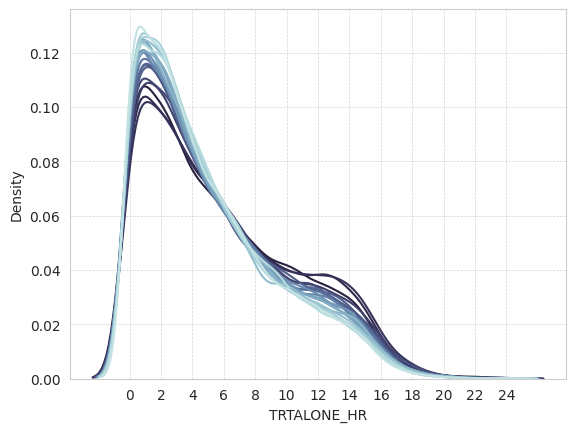

In [ ]:
import seaborn as sns
palette  = sns.color_palette("ch:start=.2,rot=-.3", as_cmap=True)
sns.kdeplot(data=resp_multi_year_filtered, x="TRTALONE_HR", hue="year", common_norm =False, palette=palette, legend=False)
plt.xticks(range(0, int(resp_multi_year_filtered['TRTALONE_HR'].max()) + 1, 2))
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgrey')


plt.savefig("2plot.svg", format="svg")
plt.show()


In [ ]:
342 minutestest3 = resp_multi_year_filtered.filter(pl.col("year").is_in([2019,2020,2021,2022]))
test3

SyntaxError: invalid syntax (3322039018.py, line 1)

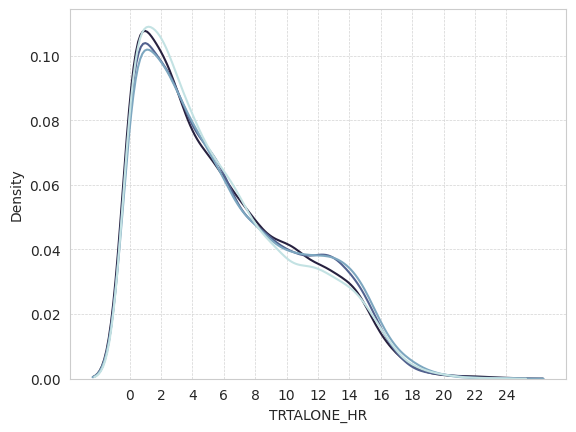

In [ ]:
import seaborn as sns
palette  = sns.color_palette("ch:start=.2,rot=-.3", as_cmap=True)
sns.kdeplot(data=test3, x="TRTALONE_HR", hue="year", common_norm =False, palette=palette, legend=False)
plt.xticks(range(0, int(resp_multi_year_filtered['TRTALONE_HR'].max()) + 1, 2))
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgrey')


plt.savefig("2plot.svg", format="svg")
plt.show()


In [ ]:
resp_multi_year_filtered.group_by(pl.col('year')).agg(pl.mean('TRTALONE')).write_csv('rtrt_by_year.csv')

In [ ]:
alone_by_year = resp_multi_year_filtered.group_by(pl.col('year')).agg(pl.mean('TRTALONE'))
alone_by_year

year,TRTALONE
i32,f64
2019,341.765024
2007,302.316052
2015,323.571206
2008,309.12222
2003,293.578764
…,…
2010,306.832051
2021,354.319137
2022,345.1191


TypeError: lmplot() got an unexpected keyword argument 'ax'

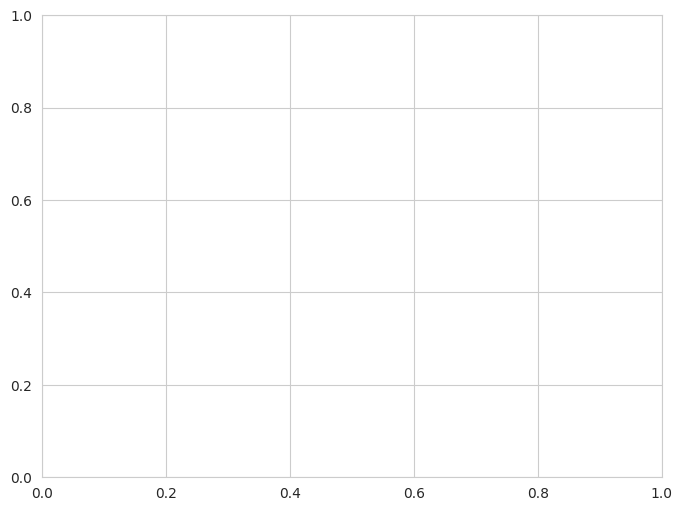

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.lmplot(x='year', y='TRTALONE', data=alone_by_year, ci=None, scatter_kws={'s': 80}, line_kws={'color': 'red'},)



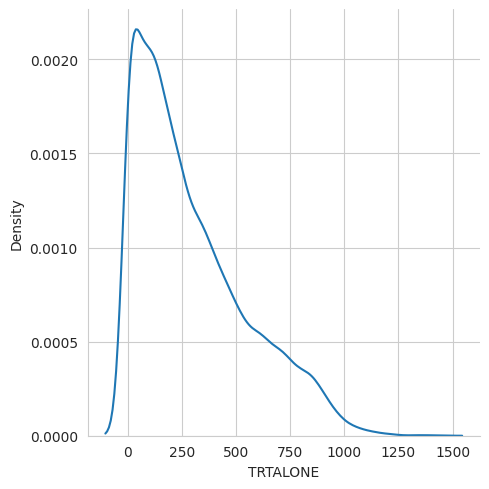

In [ ]:
sns.displot(data=test, x='TRTALONE',kind="kde", common_norm=True)

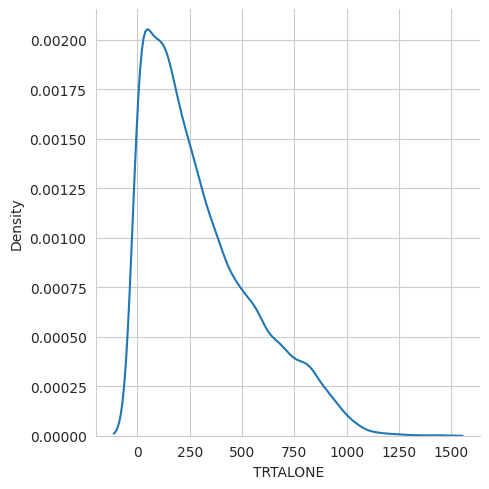

In [ ]:
sns.displot(data=test2, x='TRTALONE',kind="kde", common_norm=True)

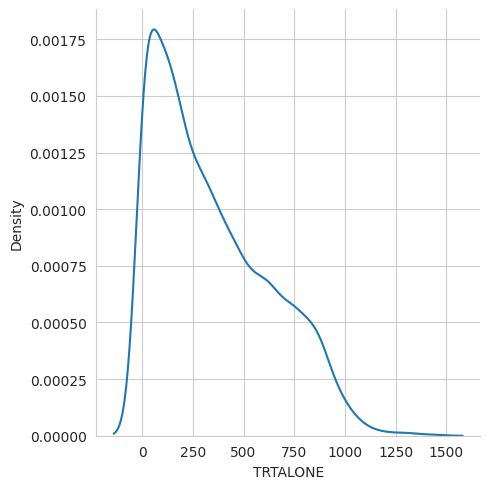

In [ ]:
sns.displot(data=test3, x='TRTALONE',kind="kde", common_norm=True)

In [ ]:
cps.columns

['TUCASEID',
 'TULINENO',
 'GEREG',
 'GEDIV',
 'GESTFIPS',
 'GTMETSTA',
 'GTCBSA',
 'GTCO',
 'HEFAMINC',
 'HEHOUSUT',
 'HEPHONEO',
 'HETELAVL',
 'HETELHHD',
 'HETENURE',
 'HRHHID',
 'HRHHID2',
 'HRHTYPE',
 'HRINTSTA',
 'HRLONGLK',
 'HRMIS',
 'HRMONTH',
 'HRNUMHOU',
 'HRYEAR4',
 'HUBUS',
 'HUBUSL1',
 'HUBUSL2',
 'HUBUSL3',
 'HUBUSL4',
 'HUFINAL',
 'HUINTTYP',
 'HUPRSCNT',
 'HURESPLI',
 'HUTYPB',
 'HUTYPC',
 'HUTYPEA',
 'HXFAMINC',
 'HXHOUSUT',
 'HXPHONEO',
 'HXTELAVL',
 'HXTELHHD',
 'HXTENURE',
 'OCCURNUM',
 'PEABSPDO',
 'PEABSRSN',
 'PEAFEVER',
 'PEAFNOW',
 'PEAFWHN1',
 'PEAFWHN2',
 'PEAFWHN3',
 'PEAFWHN4',
 'PECOHAB',
 'PECYC',
 'PEDIPGED',
 'PEDISDRS',
 'PEDISEAR',
 'PEDISEYE',
 'PEDISOUT',
 'PEDISPHY',
 'PEDISREM',
 'PEDW4WK',
 'PEDWAVL',
 'PEDWAVR',
 'PEDWLKO',
 'PEDWLKWK',
 'PEDWRSN',
 'PEDWWK',
 'PEDWWNTO',
 'PEEDUCA',
 'PEERN',
 'PEERNCOV',
 'PEERNH1O',
 'PEERNH2',
 'PEERNHRO',
 'PEERNHRY',
 'PEERNLAB',
 'PEERNPER',
 'PEERNRT',
 'PEERNUOT',
 'PEERNWKP',
 'PEFNTVTY',
 'PEHGCOMP',

# Continued

In [ ]:
alone_location_with_householdmembers = alone_location.join(cps.select("HRNUMHOU", "TUCASEID"), on = "TUCASEID")

In [ ]:
data_points_per_gestfips

GESTFIPS,data_points
i64,u32
12,426
42,316
6,754
18,198
27,173
…,…
35,74
38,33
53,219


In [ ]:
gestfips_data = {
    'State': ['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware', 'District of Columbia',
             'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine',
             'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada',
             'New Hampshire', 'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma',
             'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah', 'Vermont',
             'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming'],
    'GESTFIPS': [1, 2, 4, 5, 6, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 21, 22,
                23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41,
                42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56]
}

gestfips_df = pl.DataFrame(gestfips_data)

In [ ]:
alone_location_with_householdmembers
alone_location_with_householdmembers_states = alone_location_with_householdmembers.join(data_points_per_gestfips, on="GESTFIPS").join(gestfips_df, on="GESTFIPS")
alone_location_with_householdmembers_states

TUCASEID,TRTALONE,TULINENO,TUFINLWGT,GESTFIPS,GTCO,PRTAGE,location,HRNUMHOU,data_points,State
i64,i64,i64,f64,i64,i64,i64,str,i64,u32,str
20220101220017,110,1,3.1372e7,34,5,52,"""34-5""",6,207,"""New Jersey"""
20220101220017,110,1,3.1372e7,34,5,52,"""34-5""",6,207,"""New Jersey"""
20220101220017,110,1,3.1372e7,34,5,52,"""34-5""",6,207,"""New Jersey"""
20220101220017,110,1,3.1372e7,34,5,52,"""34-5""",6,207,"""New Jersey"""
20220101220017,110,1,3.1372e7,34,5,52,"""34-5""",6,207,"""New Jersey"""
…,…,…,…,…,…,…,…,…,…,…
20221212222322,330,1,9.2667e6,30,0,64,"""30-0""",2,51,"""Montana"""
20221212222359,0,1,9.2392e6,24,0,80,"""24-0""",2,158,"""Maryland"""
20221212222359,0,1,9.2392e6,24,0,80,"""24-0""",2,158,"""Maryland"""


In [ ]:
agg = alone_location_with_householdmembers.group_by("GESTFIPS").agg([pl.col("HRNUMHOU").mean(), pl.col("TRTALONE").mean()])
agg.filter(pl.col("GESTFIPS").is_in([48, 6, 12]))

GESTFIPS,HRNUMHOU,TRTALONE
i64,f64,f64
48,3.296958,278.849868
12,3.325048,283.631931
6,3.535035,280.447948


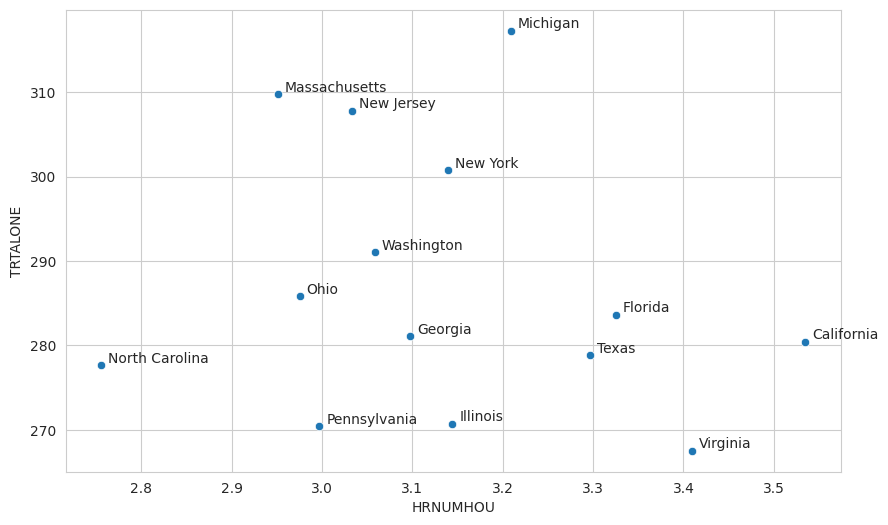

In [ ]:
agg_with_datapoint = agg.join(data_points_per_gestfips, on="GESTFIPS").join(gestfips_df, on="GESTFIPS")
agg_with_datapoint_filtered = agg_with_datapoint.filter(pl.col("data_points")>200)
fig, ax = plt.subplots(figsize=(10, 6))
sns.scatterplot(x="HRNUMHOU", y="TRTALONE", data=agg_with_datapoint_filtered)
for i, label in enumerate(agg_with_datapoint_filtered["State"]):
    ax.annotate(label, (agg_with_datapoint_filtered["HRNUMHOU"][i], agg_with_datapoint_filtered["TRTALONE"][i]), xytext=(5, 2), textcoords="offset points")

In [ ]:
alone_location_with_householdmembers_states_eighty = alone_location_with_householdmembers_states.filter(pl.col("PRTAGE")>80).filter(pl.col("data_points")>200)
agg_alone_location_with_householdmembers_states_eighty = alone_location_with_householdmembers_states_eighty.group_by("GESTFIPS").agg([pl.col("HRNUMHOU").mean(), pl.col("TRTALONE").mean()]).join(gestfips_df, on="GESTFIPS")
agg_alone_location_with_householdmembers_states_eighty

GESTFIPS,HRNUMHOU,TRTALONE,State
i64,f64,f64,str
6,1.677419,484.548387,"""California"""
12,1.533333,512.333333,"""Florida"""
13,1.0,521.666667,"""Georgia"""
17,1.909091,596.363636,"""Illinois"""
25,1.0,367.5,"""Massachusetts"""
…,…,…,…
39,1.727273,399.363636,"""Ohio"""
42,1.2,654.6,"""Pennsylvania"""
48,1.6,447.3,"""Texas"""


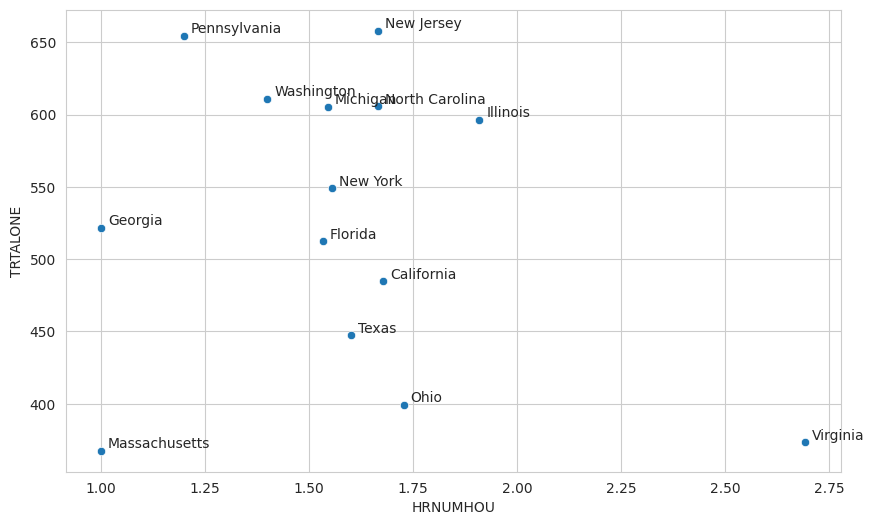

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.scatterplot(x="HRNUMHOU", y="TRTALONE", data=agg_alone_location_with_householdmembers_states_eighty)
for i, label in enumerate(agg_alone_location_with_householdmembers_states_eighty["State"]):
    ax.annotate(label, (agg_alone_location_with_householdmembers_states_eighty["HRNUMHOU"][i], agg_alone_location_with_householdmembers_states_eighty["TRTALONE"][i]), xytext=(5, 2), textcoords="offset points")

In [ ]:
alone_location_with_householdmembers_states_eighty.filter(pl.col("State")=="Massachusetts")
alone_location_with_householdmembers_states_eighty['State'].value_counts()

State,count
str,u32
"""Texas""",20
"""Illinois""",11
"""Michigan""",11
"""Massachusetts""",2
"""Georgia""",3
…,…
"""New York""",18
"""Florida""",15
"""Virginia""",13


<AxesSubplot: xlabel='HRNUMHOU', ylabel='TRTALONE'>

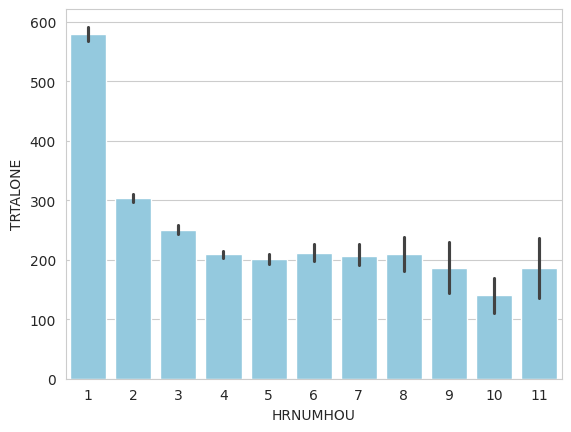

In [ ]:
sns.barplot(x="HRNUMHOU", y="TRTALONE", data = alone_location_with_householdmembers, color="skyblue")

In [ ]:
alone_location

TUCASEID,TRTALONE,TULINENO,TUFINLWGT,GESTFIPS,GTCO,PRTAGE,location
i64,i64,i64,f64,i64,i64,i64,str
20220101220017,110,1,3.1372e7,34,5,52,"""34-5"""
20220101220500,770,1,4.1333e7,25,17,30,"""25-17"""
20220101220504,350,1,5.7090e6,26,0,64,"""26-0"""
20220101220507,305,1,5.0246e6,6,59,60,"""6-59"""
20220101220552,182,1,1.2480e7,55,0,73,"""55-0"""
…,…,…,…,…,…,…,…
20221212222086,70,1,2.4181e7,36,59,44,"""36-59"""
20221212222264,65,1,1.4476e7,26,99,43,"""26-99"""
20221212222322,330,1,9.2667e6,30,0,64,"""30-0"""


In [ ]:
alone_location['location'].value_counts().write_csv('pointspercounty.csv')

In [ ]:
alone_location_state = alone_location.filter(pl.col("GTCO") == 0)
alone_location_state.write_csv("alone_location_state.csv")

In [ ]:
alone_location_county = alone_location.filter(pl.col("GTCO") != 0)
alone_location_county.write_csv("alone_location_county.csv")
pointsperstate = alone_location_state['GESTFIPS'].value_counts()
pointsperstate.write_csv("pointsperstate.csv")
pointsperstate

GESTFIPS,count
i64,u32
24,64
53,173
48,515
44,25
27,127
…,…
42,82
39,212
2,22


In [ ]:
alone_location.filter(pl.col("GESTFIPS") == 28)


TUCASEID,TRTALONE,TULINENO,TUFINLWGT,GESTFIPS,GTCO,PRTAGE,location
i64,i64,i64,f64,i64,i64,i64,str
20220111211516,148,1,1.4513e7,28,0,21,"""28-0"""
20220112210773,189,1,1.9730e7,28,0,28,"""28-0"""
20220112210976,5,1,5.2439e6,28,0,25,"""28-0"""
20220112211383,0,1,5.7249e6,28,0,58,"""28-0"""
20220112211396,290,1,3.2982e7,28,0,54,"""28-0"""
…,…,…,…,…,…,…,…
20221211220895,940,1,5.1039e6,28,0,66,"""28-0"""
20221211221220,480,1,9.7099e6,28,0,73,"""28-0"""
20221211221582,178,1,1.1071e7,28,0,63,"""28-0"""


In [ ]:
alone_location_county.describe()

statistic,TUCASEID,TRTALONE,TULINENO,TUFINLWGT,GESTFIPS,GTCO,PRTAGE,location
str,f64,f64,f64,f64,f64,f64,f64,str
"""count""",3520.0,3520.0,3520.0,3520.0,3520.0,3520.0,3520.0,"""3520"""
"""null_count""",0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""0"""
"""mean""",2.0221e13,349.421307,1.0,1.2397e7,23.876705,71.17642,52.642614,null
"""std""",3.5019e8,281.460949,0.0,1.1419e7,14.781082,89.251062,18.178103,null
"""min""",2.0220e13,0.0,1.0,1.1915e6,1.0,1.0,15.0,"""1-3"""
"""25%""",2.0220e13,115.0,1.0,5.6695e6,9.0,19.0,38.0,null
"""50%""",2.0221e13,289.0,1.0,9.1848e6,25.0,57.0,54.0,null
"""75%""",2.0221e13,555.0,1.0,1.4774e7,36.0,97.0,68.0,null
"""max""",2.0221e13,1440.0,1.0,1.5984e8,55.0,810.0,85.0,"""9-9"""


In [ ]:
alone_location_state.select("TRTALONE")
alone_location_county.select("TRTALONE")
combined_col = pl.concat([alone_location_state.select("TRTALONE"), alone_location_county.select("TRTALONE")], how="vertical")
combined_col
import numpy as np
np.quantile(combined_col["TRTALONE"], [0.1, 0.25, 0.5, 0.75, 0.9])

array([ 20., 105., 280., 545., 780.])

<AxesSubplot: xlabel='TRTALONE', ylabel='Count'>

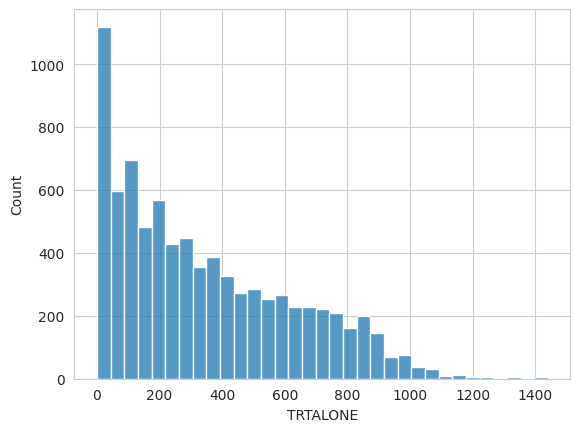

In [ ]:
sns.histplot(data=combined_col, x="TRTALONE")

In [ ]:
alone_location_county = alone_location.filter(pl.col("GTCO") != 0)

In [ ]:
combined_col

TRTALONE
i64
350
182
180
545
0
…
165
0
70


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=780d40c9-040a-4c10-9a99-2fc6fbcb4e83' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>